In [2]:
import pandas as pd
import geopandas as gpd
import os
import numpy as np
import matplotlib.pyplot as plt
import pickle
import shap
from shapely import Point, wkt
import osmnx as ox
import imageio.v2 as imageio
import glob

# !pip install spatial-kfold
from spatialkfold.blocks import spatial_blocks 
from spatialkfold.clusters import spatial_kfold_clusters 
from sklearn.model_selection import train_test_split, GridSearchCV, LeaveOneGroupOut, cross_validate, GroupKFold
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from xgboost import XGBRegressor


random_seed = 100

london = ox.geocode_to_gdf('Greater London, UK')
london.to_crs(epsg=27700, inplace=True)
boros = gpd.read_file(os.path.join('data','shapefile','statistical-gis-boundaries-london','ESRI','London_Borough_Excluding_MHW.shp'))
boros.to_crs(epsg=27700, inplace=True)

# Prep data

In [1]:
# define target variable columns
targets = ['Total', 'Morning', 'Midday', 'Evening', 'Late']
targets_log = ['log_'+t for t in targets]

In [6]:
# define feature columns
features = ['population', 
            'poi_banking', 'poi_hotels','poi_leisure_active', 'poi_leisure_entertainment','poi_leisure_outdoor',
            'poi_medical', 'poi_nature', 'poi_public_facilities', 'poi_religious','poi_restaurants','poi_tourism','poi_shopping',
            'transport_bus','transport_rail','transport_other',
            'diversity_poi','diversity_transp_mode','diversity_transp_opt',
            'cent_bus_degree','cent_bus_closeness','cent_bus_betweenness',
            'cent_rail_degree','cent_rail_closeness','cent_rail_betweenness'
            ]

features_main = ['population', 
            'poi_banking', 'poi_hotels','poi_leisure_active', 'poi_leisure_entertainment','poi_leisure_outdoor',
            'poi_medical', 'poi_nature', 'poi_public_facilities', 'poi_religious','poi_restaurants','poi_tourism','poi_shopping',
            'transport_bus','transport_rail','transport_other'
            ]

# lags as features
lags = ['lag_'+t for t in targets] #to pick one depending on the target

In [4]:
df = pd.read_csv('data/cleaned/df_ml_new.csv',low_memory=True)
df['geometry'] = df['geometry'].apply(wkt.loads)
df = gpd.GeoDataFrame(df, geometry='geometry', crs='EPSG:27700')
df.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 16890 entries, 0 to 16889
Data columns (total 39 columns):
 #   Column                     Non-Null Count  Dtype   
---  ------                     --------------  -----   
 0   id_code                    16890 non-null  object  
 1   geometry                   16890 non-null  geometry
 2   population                 16890 non-null  float64 
 3   poi_banking                16890 non-null  float64 
 4   poi_hotels                 16890 non-null  float64 
 5   poi_leisure_active         16890 non-null  float64 
 6   poi_leisure_entertainment  16890 non-null  float64 
 7   poi_leisure_outdoor        16890 non-null  float64 
 8   poi_medical                16890 non-null  float64 
 9   poi_nature                 16890 non-null  float64 
 10  poi_public_facilities      16890 non-null  float64 
 11  poi_religious              16890 non-null  float64 
 12  poi_restaurants            16890 non-null  float64 
 13  poi_shopping           

In [7]:
# Log transform the target variable
for col in targets:
    df['log_'+col] = df[col].apply(lambda x: 0 if x==0 else np.log(x))
df.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 16890 entries, 0 to 16889
Data columns (total 44 columns):
 #   Column                     Non-Null Count  Dtype   
---  ------                     --------------  -----   
 0   id_code                    16890 non-null  object  
 1   geometry                   16890 non-null  geometry
 2   population                 16890 non-null  float64 
 3   poi_banking                16890 non-null  float64 
 4   poi_hotels                 16890 non-null  float64 
 5   poi_leisure_active         16890 non-null  float64 
 6   poi_leisure_entertainment  16890 non-null  float64 
 7   poi_leisure_outdoor        16890 non-null  float64 
 8   poi_medical                16890 non-null  float64 
 9   poi_nature                 16890 non-null  float64 
 10  poi_public_facilities      16890 non-null  float64 
 11  poi_religious              16890 non-null  float64 
 12  poi_restaurants            16890 non-null  float64 
 13  poi_shopping           

# Model Outlier detection

In [8]:
# Load model
with open('data/modeltraining/best_xgb_1407.pkl', 'rb') as file:
    model = pickle.load(file)

In [9]:
# Function to simplify get outliers with residuals outside +/- 1.5*iqr
def get_outliers(df, model, features, target):
    target_sel = 'log_'+target
    features_sel = features + [lags[targets_log.index(target_sel)]] 

    # select the features and target
    X = df[features_sel]  
    y = df[target_sel]

    # Scale the data
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)
    model.fit(X_scaled, y)

    # Predict the water consumption on test set
    y_pred = model.predict(X_scaled)
    # Calculate the residuals
    residuals = y - y_pred
    
    df['residuals_'+target] = residuals # create new column
    df['is_outlier_'+target] = 0 # create new column

    # Identify buildings with residuals more than +/- 1.5*IQR
    q1 = residuals.quantile(0.25)
    q3 = residuals.quantile(0.75)
    iqr = q3 - q1

    df['is_outlier_'+target] = 0 # create new column
    outliers_upper = df[residuals > q3 + 1.5*iqr] # underpredicting
    outliers_lower = df[residuals < q1 - 1.5*iqr] # overpredicting

    # Mark the outliers
    df.loc[outliers_upper.index, 'is_outlier_'+target] = 1
    df.loc[outliers_lower.index, 'is_outlier_'+target] = 1

    outliers = pd.concat([outliers_upper, outliers_lower])

    return outliers # df with outliers

Timeband: Total
Number of outliers - underpredicting: 249
Number of outliers - overpredicting: 327


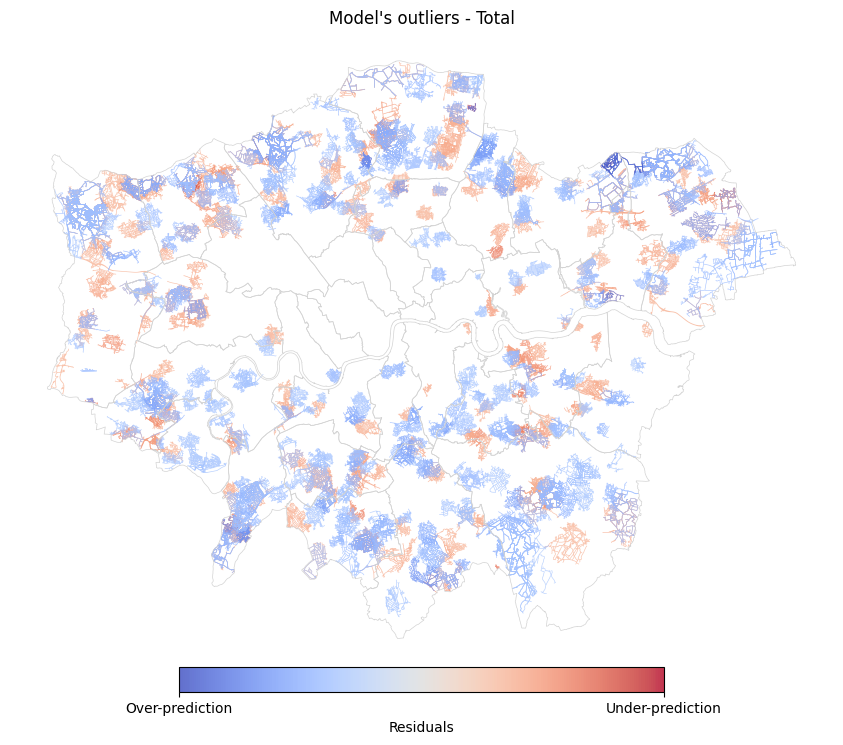

Timeband: Morning
Number of outliers - underpredicting: 249
Number of outliers - overpredicting: 333


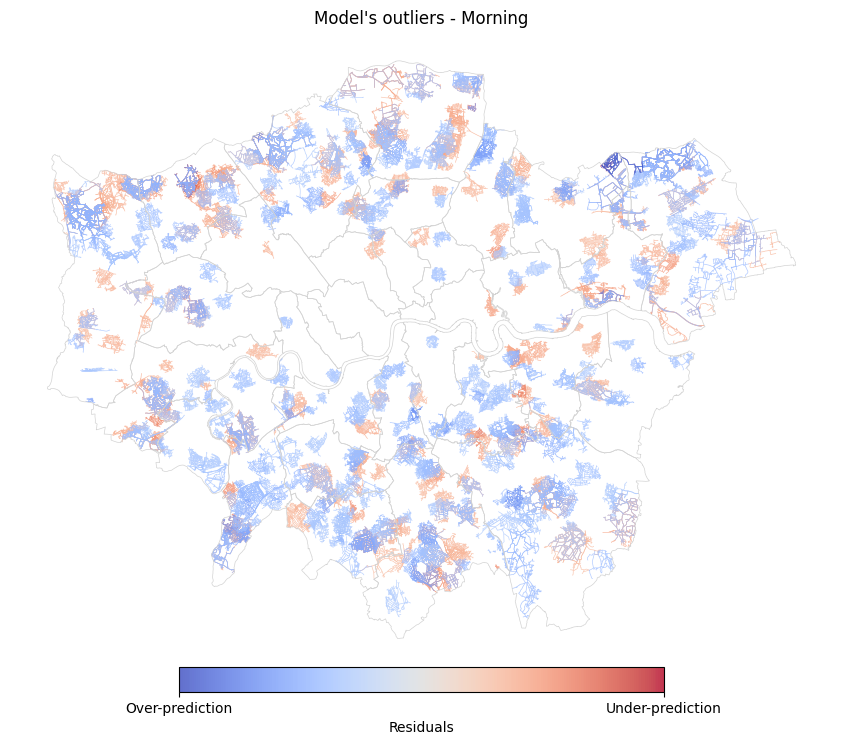

Timeband: Midday
Number of outliers - underpredicting: 266
Number of outliers - overpredicting: 320


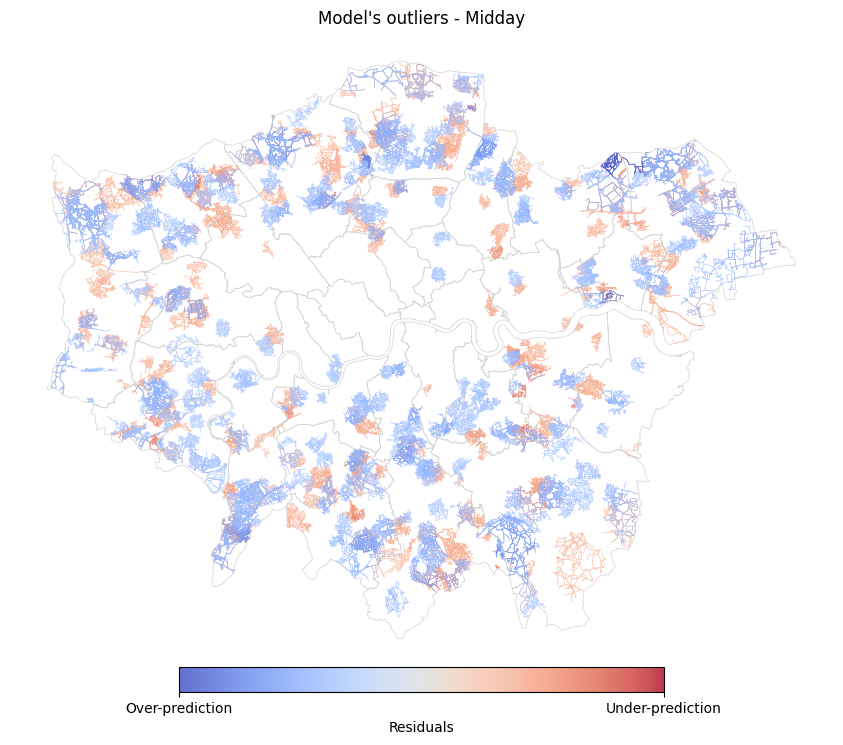

Timeband: Evening
Number of outliers - underpredicting: 292
Number of outliers - overpredicting: 337


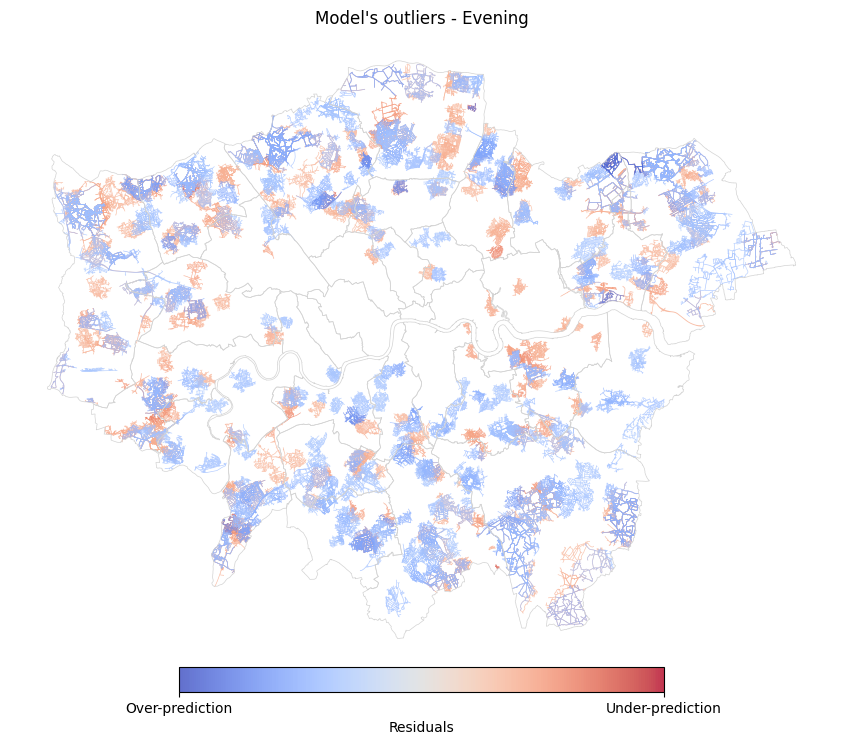

Timeband: Late
Number of outliers - underpredicting: 267
Number of outliers - overpredicting: 327


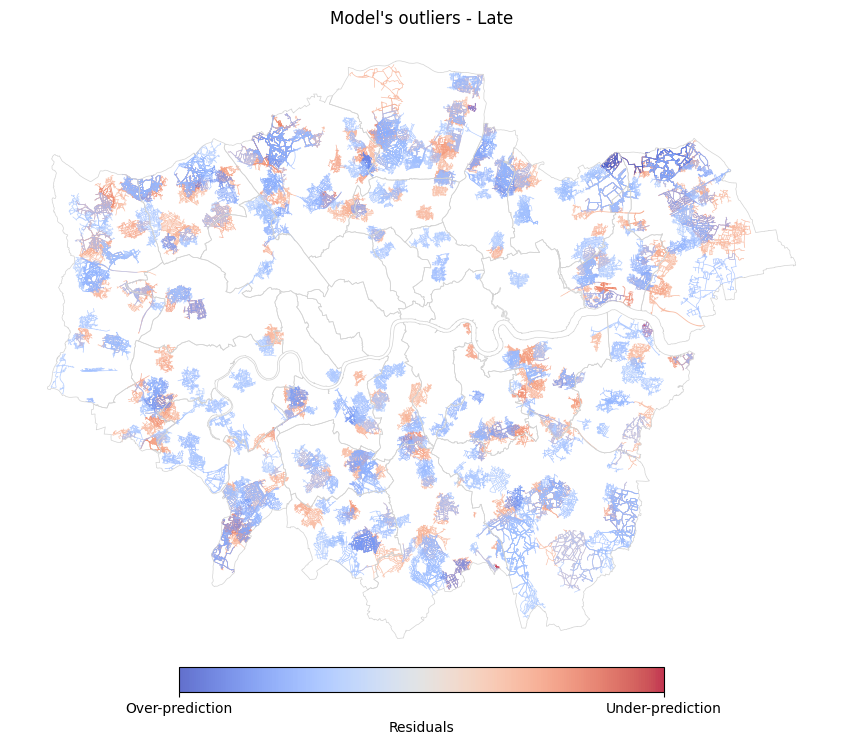

In [21]:
# Get and Plot the outliers for each timeband
for i,target in enumerate(targets):
    
    # Get outliers
    df_outliers = get_outliers(df, model, features, target)
    col_name = 'residuals_'+target

    #Report
    num_outliers_upper = (df_outliers[col_name] > 0).sum()
    num_outliers_lower = (df_outliers[col_name] < 0).sum()

    print(f"Timeband: {target}")
    print(f"Number of outliers - underpredicting: {num_outliers_upper}")
    print(f"Number of outliers - overpredicting: {num_outliers_lower}")

    # Plot
    vmin = -0.07
    vmax = 0.07
    fig, ax = plt.subplots(1, 1, figsize=(10, 8))
    df_outliers.plot(ax=ax, 
                    column = col_name, 
                    alpha=0.8, legend=False, 
                    cmap='coolwarm',
                    vmin=vmin, vmax=vmax)
                    
    boros.boundary.plot(ax=ax, color='lightgrey', linewidth=0.5)
    
    # Add colorbar
    cbar = fig.colorbar(ax.collections[0], ax=ax, orientation='horizontal', ticks=[-0.07, 0.07],shrink=0.5, pad=0)
    cbar.ax.set_xticklabels(['Over-prediction', 'Under-prediction'])  # horizontal colorbar
    cbar.set_label('Residuals')

    plt.title('Model\'s outliers - '+target)
    plt.axis('off')
    plt.tight_layout()
    plt.savefig(f'output/outliers/{i} {target}.png')
    plt.show()

In [22]:
# create a gif of the outliers for all timebands
images = []
for filename in sorted(glob.glob('output/outliers/*.png')):
    if 'Total' not in filename:
        images.append(imageio.imread(filename))

imageio.mimsave('output/outliers/gif/outliers_iqr.gif', images, duration=1000, loop=0)

# Explore outliers

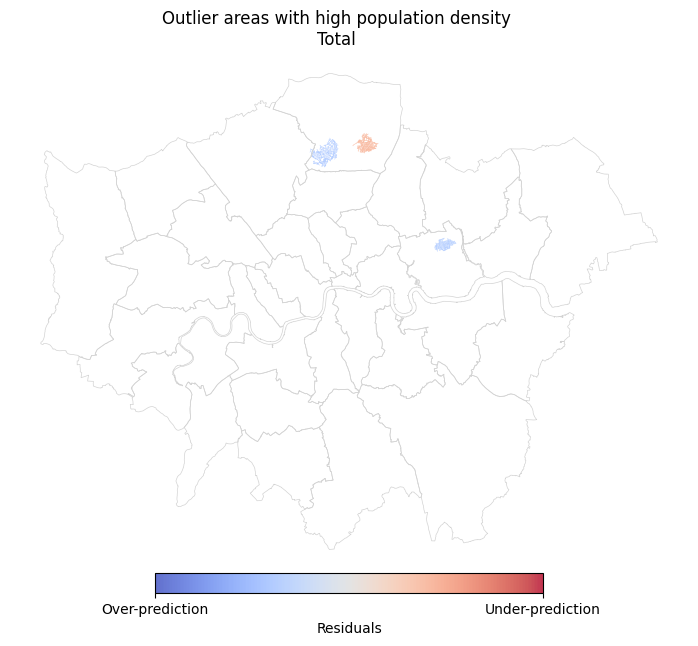

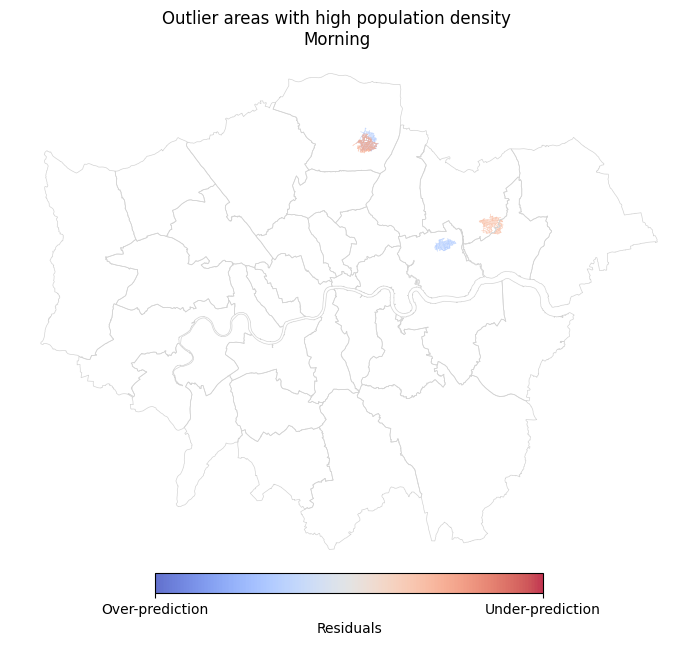

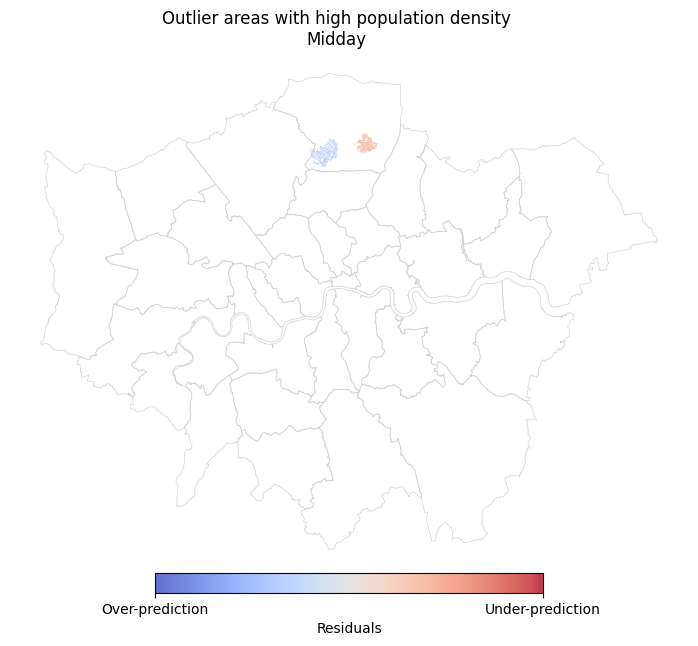

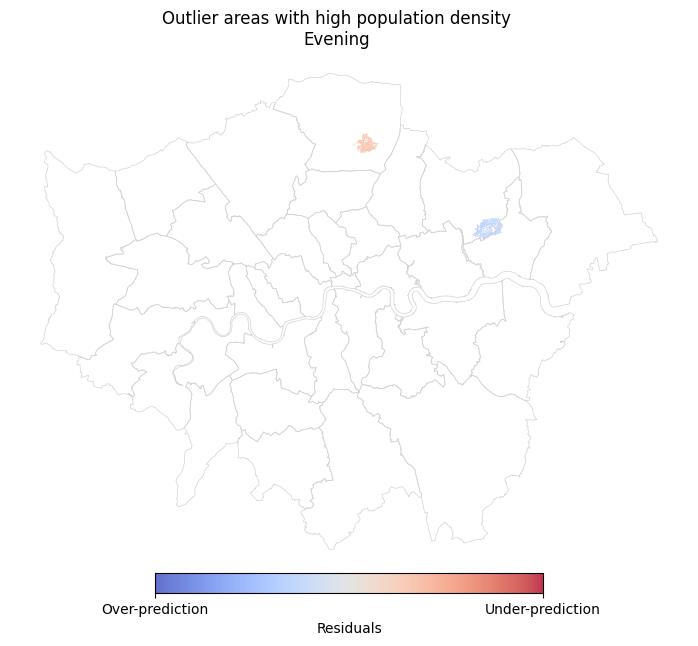

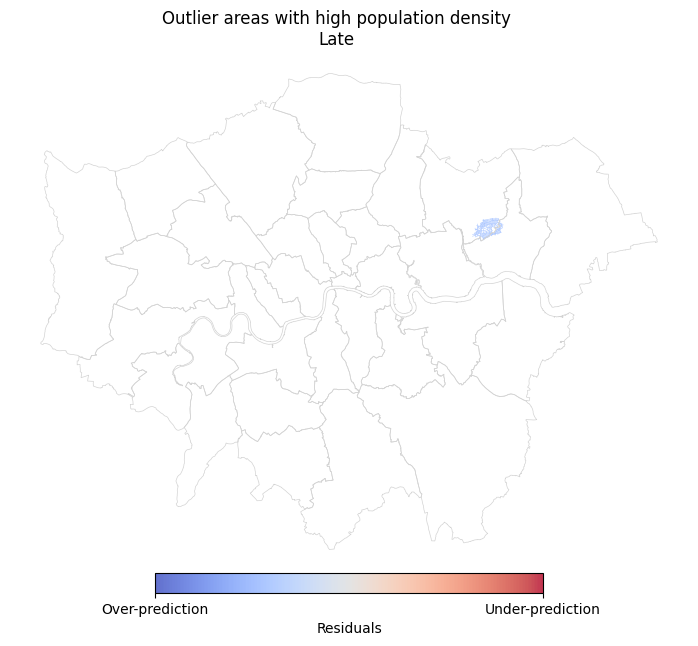

...

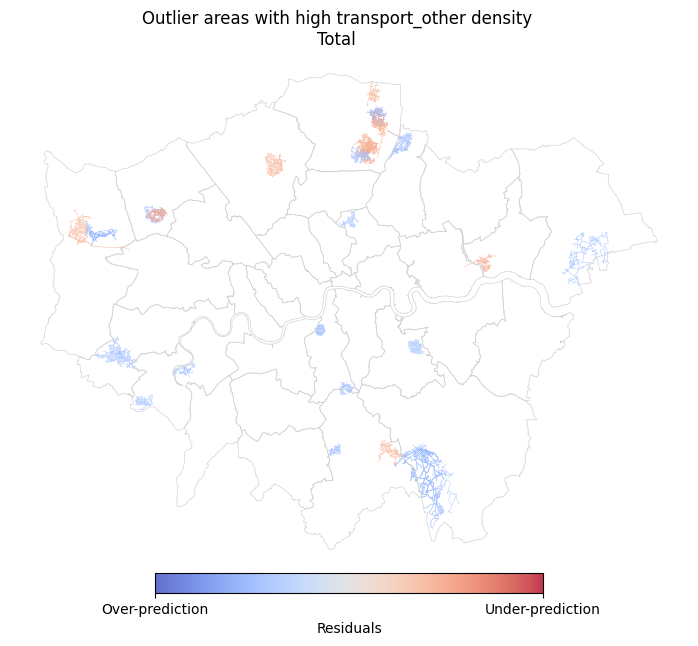

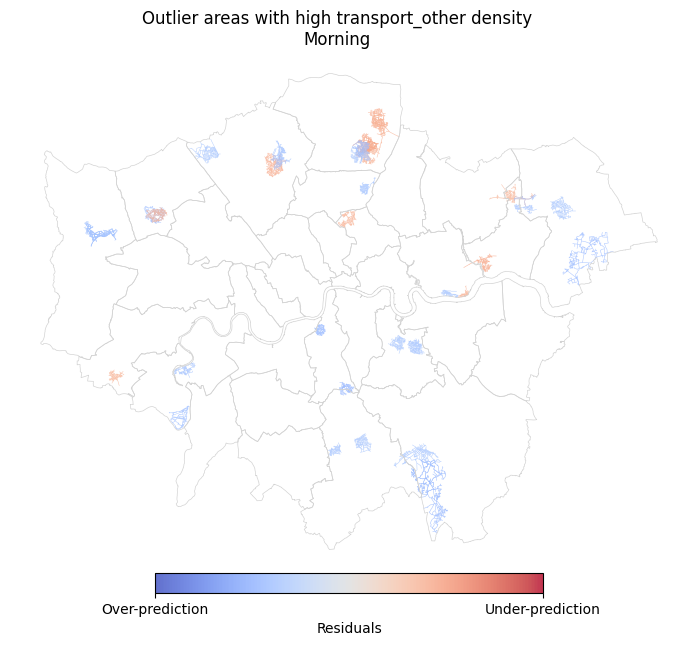

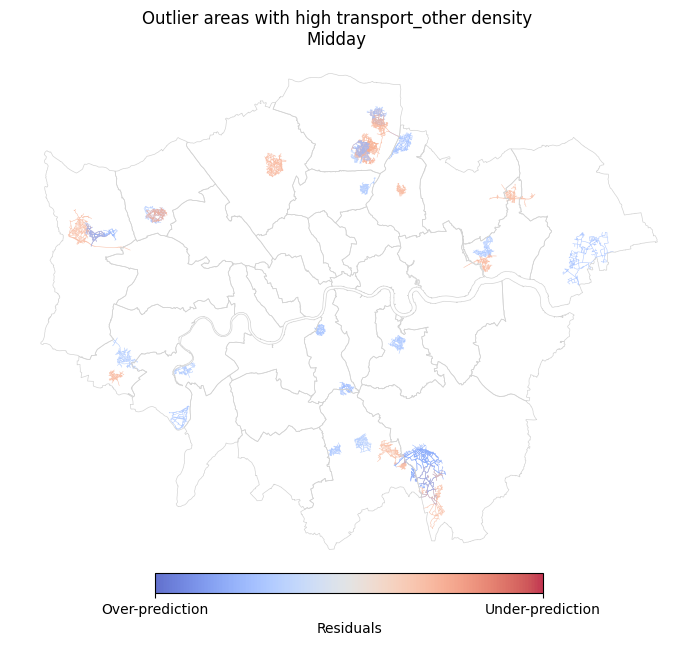

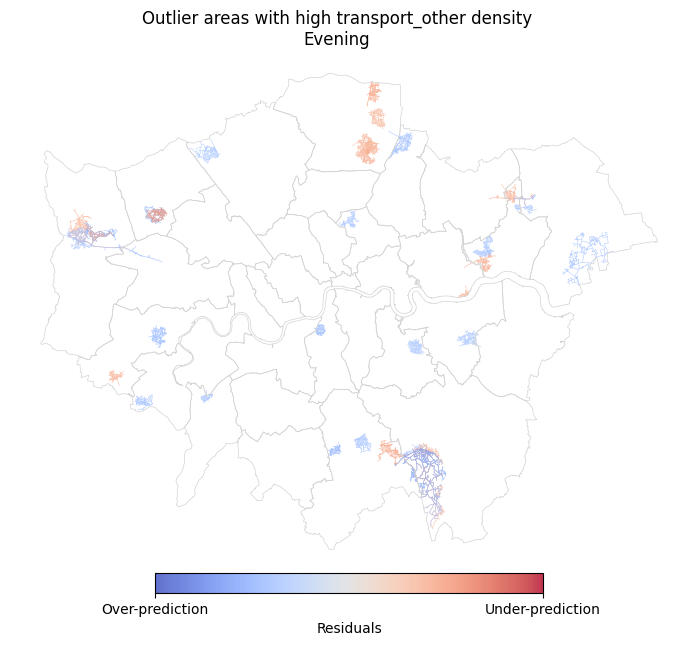

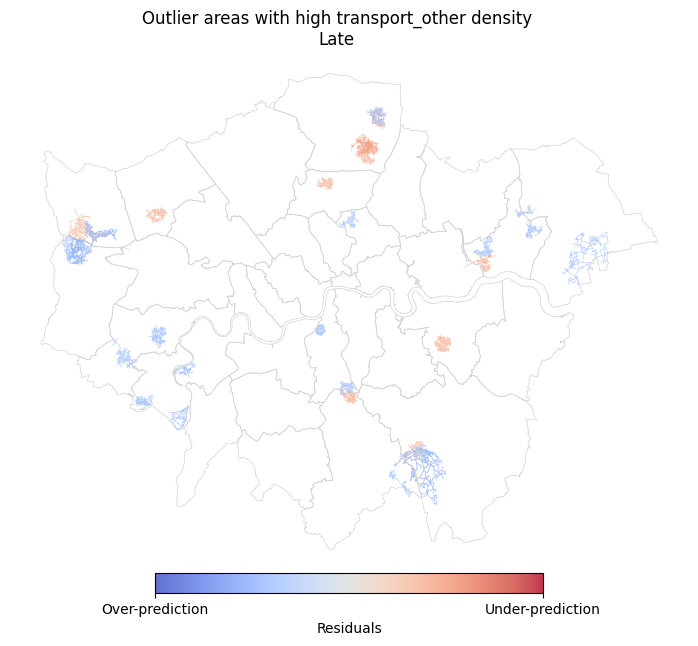

In [26]:
for feature in features_main:  
    for i,target in enumerate(targets):   

        # Get outliers           
        df_outlier_toPlot = df[df[f'is_outlier_{target}']==1]
        
        q1 = df_outlier_toPlot[feature].quantile(0.25)
        q3 = df_outlier_toPlot[feature].quantile(0.75)

        iqr = q3 - q1
        lower_bound = q1 - 1.5*iqr
        upper_bound = q3 + 1.5*iqr
        
        df_plot = df_outlier_toPlot[(df_outlier_toPlot[feature] > upper_bound)]
        
        col_name = 'residuals_'+target

        # Plot
        vmin = -0.07
        vmax = 0.07
        fig, ax = plt.subplots(1, 1, figsize=(10, 8))
        df_plot.plot(ax=ax, 
                    column = col_name, 
                    alpha=0.8, legend=False, 
                    cmap='coolwarm',
                    vmin=vmin, vmax=vmax)
                    
        boros.boundary.plot(ax=ax, color='lightgrey', linewidth=0.5)
    
        # Add colorbar
        cbar = fig.colorbar(ax.collections[0], ax=ax, orientation='horizontal', ticks=[vmin, vmax],shrink=0.5, pad=0)
        cbar.ax.set_xticklabels(['Over-prediction', 'Under-prediction'])  # horizontal colorbar
        cbar.set_label('Residuals')

        plt.axis('off')
        plt.suptitle(f'Outlier areas with high {feature} density\n{target}',y=0.93)
        plt.savefig(f'output/outliers/{i} {feature} - {target}.jpg')
        plt.show()
    
    # create a gif of the outliers for all timebands with {feautre}
    images_ = []
    for filename in sorted(glob.glob('output/outliers/*.jpg')):
        if ('Total' not in filename) and (feature in filename):
            images_.append(imageio.imread(filename))

    imageio.mimsave(f'output/outliers/gif/outlier_{feature}.gif', images_, duration=1000, loop=0)  

# Explore SHAP value (based on non-outliers only)

In [27]:
import shap

In [28]:
# Function to get SHAP values
def get_shap_values(model, target):
    target_sel = 'log_'+target
    features_sel = features + [lags[targets_log.index(target_sel)]]

    # non-outliers only
    df_nonoutlier = df[df['is_outlier_'+target] == 0]

    # select the features and target
    X = df_nonoutlier[features_sel]  
    y = df_nonoutlier[target_sel]

    # Scale the data
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)
    model.fit(X_scaled, y)

    # Calculate SHAP values
    explainer = shap.Explainer(model,shap.sample(X_scaled, 1000))
    X_scaled = pd.DataFrame(X_scaled, columns=features_sel)
    shap_values = explainer(shap.sample(X_scaled, 1000))

    return shap_values # explainer object

In [29]:
# Get SHAP values for each target (plotting)
shap_plot_dict = {}
for target in targets:
    shap_values = get_shap_values(model, target)
    shap_plot_dict[target] = shap_values

  7%|=                   | 70/1000 [01:22<18:09]       

In [ ]:
for target in targets:
    shap_values = shap_plot_dict[target]
    
    shap.plots.beeswarm(shap_values, max_display=20,show=False)

    plt.title('SHAP feature importance for '+target)
    plt.tight_layout()
    plt.savefig(f'output/shap/new_{target}.png')
    plt.show()

In [ ]:
for target in targets:
    shap_values = shap_plot_dict[target]
    
    clustering = shap.utils.hclust(X_scaled, y)
    shap.plots.bar(shap_Morning, max_display=20, clustering=clustering, clustering_cutoff=0.45)

    plt.title('SHAP feature importance for '+target' with correlated feature clusters')
    plt.tight_layout()
    plt.savefig(f'output/shap/new_barclus_{target}.png')
    plt.show()

In [ ]:
    shap.plots.beeswarm(shap_values, max_display=20)
    
    clustering = shap.utils.hclust(X_scaled, y)
    shap.plots.bar(shap_values, max_display=20, clustering=clustering, clustering_cutoff=0.45)

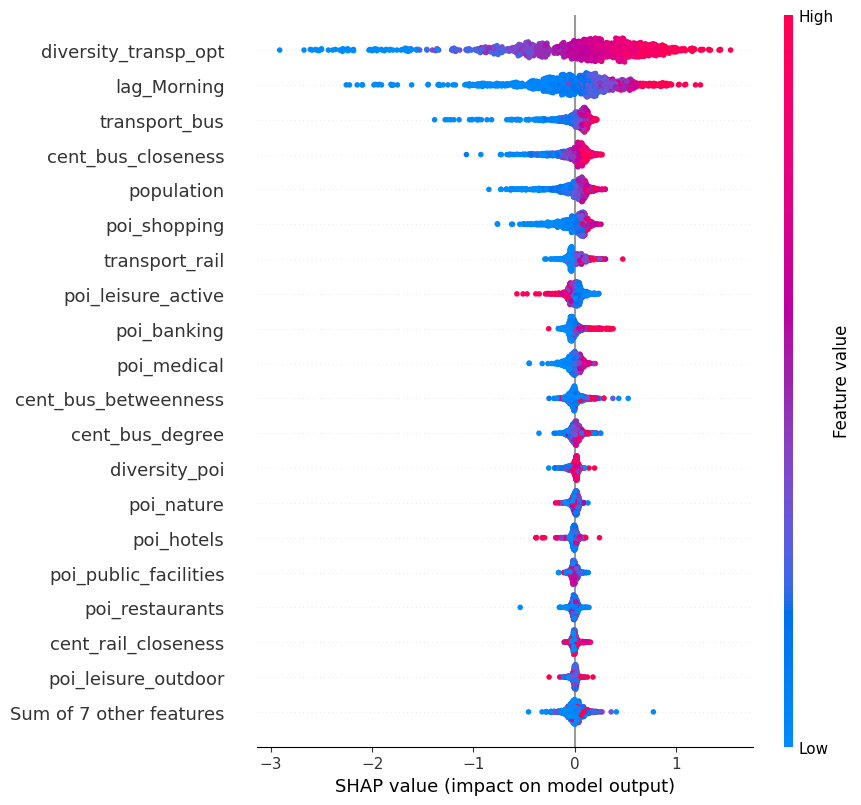

In [222]:
shap.plots.beeswarm(shap_Morning, max_display=20)

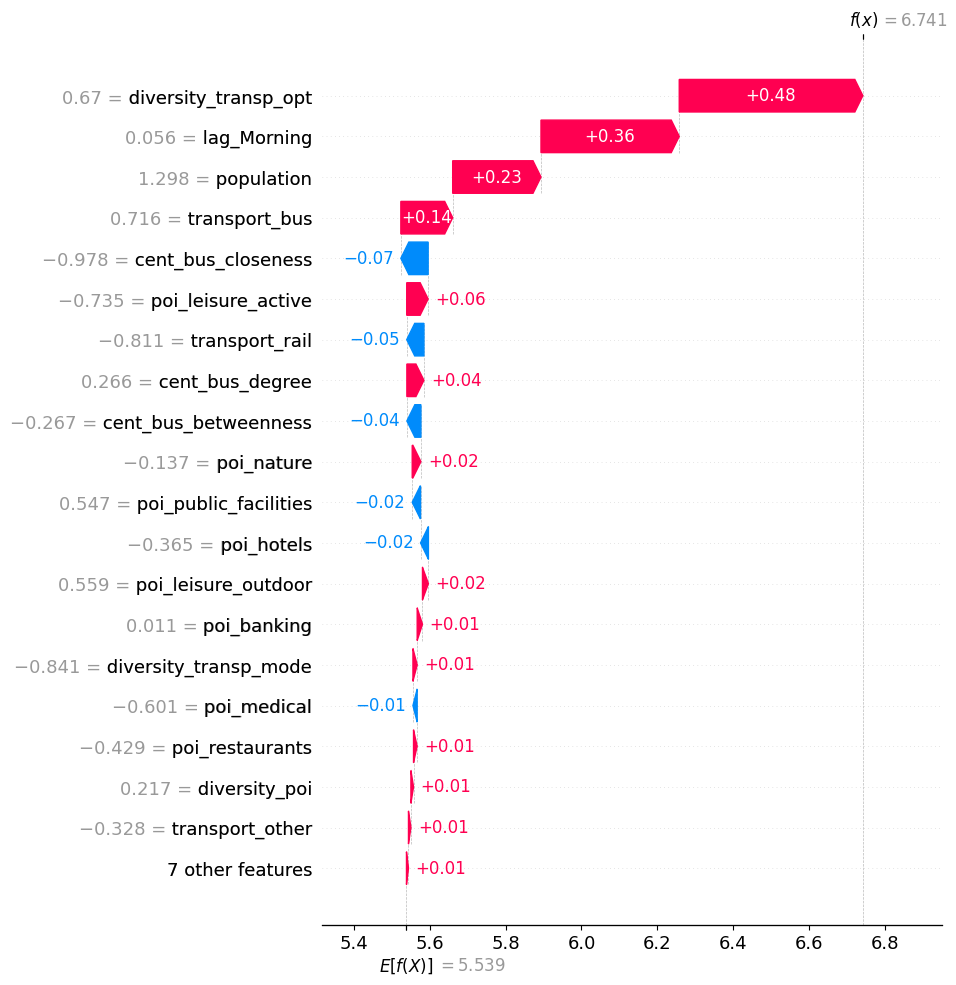

In [238]:
shap.plots.waterfall(shap_Morning[35], max_display=20)

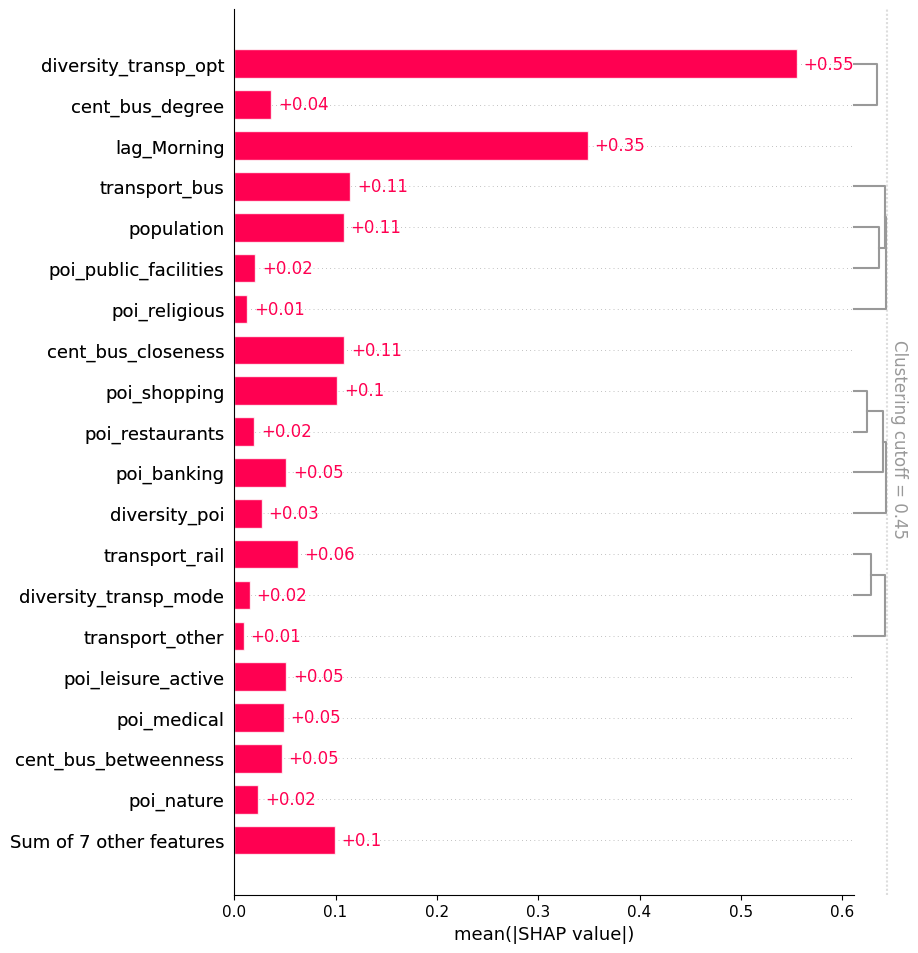

In [234]:
clustering = shap.utils.hclust(X_scaled, y)
shap.plots.bar(shap_Morning, max_display=20, clustering=clustering, clustering_cutoff=0.45)